In [1]:
import deepchem as dc

# Load with graph features
tox21_tasks, datasets, transformers = dc.molnet.load_tox21(featurizer='GraphConv')
train_dataset, valid_dataset, test_dataset = datasets

print(f"Number of tasks: {len(tox21_tasks)}")
print(f"Train molecules: {len(train_dataset)}")


No normalization for SPS. Feature removed!
No normalization for AvgIpc. Feature removed!
No normalization for NumAmideBonds. Feature removed!
No normalization for NumAtomStereoCenters. Feature removed!
No normalization for NumBridgeheadAtoms. Feature removed!
No normalization for NumHeterocycles. Feature removed!
No normalization for NumSpiroAtoms. Feature removed!
No normalization for NumUnspecifiedAtomStereoCenters. Feature removed!
No normalization for Phi. Feature removed!


Instructions for updating:
experimental_relax_shapes is deprecated, use reduce_retracing instead


Skipped loading modules with pytorch-geometric dependency, missing a dependency. No module named 'torch_geometric'
Skipped loading modules with transformers dependency. No module named 'transformers'
cannot import name 'HuggingFaceModel' from 'deepchem.models.torch_models' (c:\Projects\QChem\venv\Lib\site-packages\deepchem\models\torch_models\__init__.py)
Skipped loading modules with pytorch-geometric dependency, missing a dependency. cannot import name 'DMPNN' from 'deepchem.models.torch_models' (c:\Projects\QChem\venv\Lib\site-packages\deepchem\models\torch_models\__init__.py)
Skipped loading modules with pytorch-lightning dependency, missing a dependency. No module named 'lightning'
Skipped loading some Jax models, missing a dependency. No module named 'jax'
[07:02:29] DEPRECATION WARNING: please use GetValence(getExplicit=False)
[07:02:29] DEPRECATION WARNING: please use GetValence(getExplicit=False)
[07:02:29] DEPRECATION WARNING: please use GetValence(getExplicit=False)
[07:02:29

Number of tasks: 12
Train molecules: 6258


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from rdkit import Chem
from rdkit.Chem import Descriptors

# Convert dataset to Pandas DataFrame
def dataset_to_df(dataset, tasks):
    X = [mol for mol in dataset.X]
    y = dataset.y
    smiles = dataset.ids
    return pd.DataFrame({'smiles': smiles, 'graph': X, 'label': list(y)})

df = dataset_to_df(train_dataset, tox21_tasks)

# Calculate molecular weights
df['mol'] = df['smiles'].apply(Chem.MolFromSmiles)
df['mol_wt'] = df['mol'].apply(Descriptors.MolWt)
df['num_atoms'] = df['mol'].apply(lambda x: x.GetNumAtoms() if x else None)


[07:06:08] WARNING: not removing hydrogen atom without neighbors


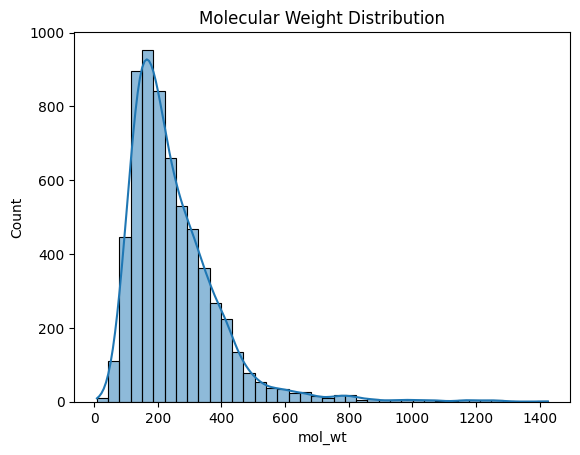

In [3]:
sns.histplot(df['mol_wt'], bins=40, kde=True)
plt.title('Molecular Weight Distribution')
plt.show()

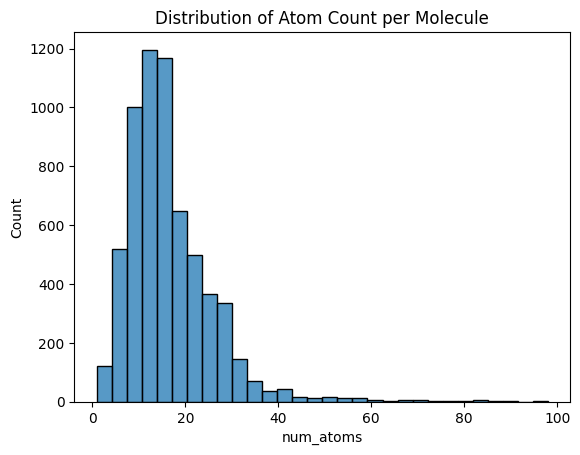

In [4]:
sns.histplot(df['num_atoms'], bins=30)
plt.title('Distribution of Atom Count per Molecule')
plt.show()


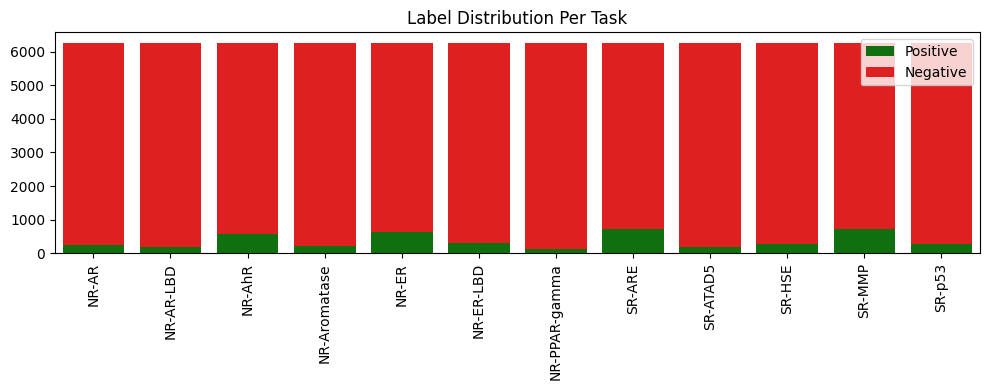

In [5]:
import numpy as np
labels = np.array(df['label'].tolist())
task_pos_counts = (labels == 1).sum(axis=0)
task_neg_counts = (labels == 0).sum(axis=0)

plt.figure(figsize=(10,4))
sns.barplot(x=tox21_tasks, y=task_pos_counts, color='green', label='Positive')
sns.barplot(x=tox21_tasks, y=task_neg_counts, color='red', label='Negative', bottom=task_pos_counts)
plt.xticks(rotation=90)
plt.legend()
plt.title("Label Distribution Per Task")
plt.tight_layout()
plt.show()
